In [34]:
import yaml
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import MultipleLocator
#import cmasher as cmr
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import re

import IPython
notebook_name = "/".join(
        IPython.extract_module_locals()[1]["__vsc_ipynb_file__"].split("/")[-5:]
    )

#Plot formatting
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['axes.titlesize'] = 28
mpl.rcParams['axes.xmargin'] = 0

# Set the font family to 'serif'
mpl.rcParams['font.family'] = 'serif'
# Specify preferred serif font (Computer Modern Roman is 'cmr10')
mpl.rcParams['font.serif'] = 'Lato' 
# Optionally, configure mathtext to use Computer Modern fonts as well
mpl.rcParams['mathtext.fontset'] = 'cm'
# Ensure minus signs are rendered correctly with CM fonts
mpl.rcParams['axes.unicode_minus'] = False

In [2]:
#Colorblind friendly colors in RGB:
forest_green_color = np.array([51,117,56])
bright_green_color = np.array([51, 117, 56])
indigo_color = np.array([46, 37, 133])
bright_blue_color = np.array([0, 114, 178])
light_blue_color = np.array([86, 180, 233])
pale_blue_color = np.array([148, 203, 236])
yellow_orange_color = np.array([230, 159, 0])
sunny_yellow_color = np.array([230, 159, 20])
lemon_yellow_color = np.array([240, 228, 66])
bright_orange_color = np.array([93, 168, 153])
desaturated_pink_color = np.array([194, 106, 119])
saturated_orchid_color = np.array([194, 106, 119])
purple_orchid_color = np.array([159, 74, 150])


def rgb_range_correction(color_names):
    mpl_formatted_colors = []
    for c in range(0,len(color_names)):
        rgb_division = color_names[c]/255
        mpl_formatted_colors.append(rgb_division)
    return mpl_formatted_colors

four_colorset1 = rgb_range_correction([forest_green_color, light_blue_color, sunny_yellow_color, desaturated_pink_color])

In [148]:
#read YAML files
dirpath = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/'

run_month = '8'
run_number = '48'
mech_name = ['CB6r5h', 'CRACMM', 'GEOS-Chem', 'MCM']

df_CB6r5h_species_conc = pd.DataFrame()
df_CRACMM_species_conc = pd.DataFrame()
df_GEOSChem_species_conc = pd.DataFrame()
df_MCM_species_conc = pd.DataFrame()

In [125]:
for mech in mech_name:
    for run_day in range(4,8):
        run_date = run_month + '_' + str(run_day) + '_' + '2024'
        yaml_usos_dirpath = dirpath + 'F0AM-4.4.2/Runs/USOS_' + run_date
        yaml_usos_full_filepath_species_conc = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_species_conc_output' + '.yaml'
        yaml_usos_full_filepath_analysis = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_analysis_output' + '.yaml'
        print('Now loading file: ', yaml_usos_full_filepath_species_conc)
        print('Now loading file: ', yaml_usos_full_filepath_analysis)

        with open(yaml_usos_full_filepath_species_conc, 'r') as f:
            yaml_usos_species_conc = yaml.full_load(f)
        with open(yaml_usos_full_filepath_analysis, 'r') as f:
            yaml_usos_analysis = yaml.full_load(f)

        if mech == 'CB6r5h':
            CB6r5h_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                CB6r5h_yaml_usos_analysis_0804 = CB6r5h_yaml_usos_analysis
            elif run_day == 5:
                CB6r5h_yaml_usos_analysis_0805 = CB6r5h_yaml_usos_analysis
            elif run_day == 6:
                CB6r5h_yaml_usos_analysis_0806 = CB6r5h_yaml_usos_analysis
            elif run_day == 7:
                CB6r5h_yaml_usos_analysis_0807 = CB6r5h_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'CRACMM':
            CRACMM_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                CRACMM_yaml_usos_analysis_0804 = CRACMM_yaml_usos_analysis
            elif run_day == 5:
                CRACMM_yaml_usos_analysis_0805 = CRACMM_yaml_usos_analysis
            elif run_day == 6:
                CRACMM_yaml_usos_analysis_0806 = CRACMM_yaml_usos_analysis
            elif run_day == 7:
                CRACMM_yaml_usos_analysis_0807 = CRACMM_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'GEOS-Chem':
            GEOS_Chem_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                GEOS_Chem_yaml_usos_analysis_0804 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 5:
                GEOS_Chem_yaml_usos_analysis_0805 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 6:
                GEOS_Chem_yaml_usos_analysis_0806 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 7:
                GEOS_Chem_yaml_usos_analysis_0807 = GEOS_Chem_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'MCM':
            MCM_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                MCM_yaml_usos_analysis_0804 = MCM_yaml_usos_analysis
            elif run_day == 5:
                MCM_yaml_usos_analysis_0805 = MCM_yaml_usos_analysis
            elif run_day == 6:
                MCM_yaml_usos_analysis_0806 = MCM_yaml_usos_analysis
            elif run_day == 7:
                MCM_yaml_usos_analysis_0807 = MCM_yaml_usos_analysis
            else:
                print('run_day invalid')

        else:
            print('Mechanism name invalid')

        processed_data_species_conc = {k: [item[0] if isinstance(item, list) else item for item in v] for k, v in yaml_usos_species_conc.items()}
        df_yaml_species_conc = pd.DataFrame(processed_data_species_conc)

        
        if mech == 'CB6r5h':
            df_CB6r5h_species_conc = pd.concat([df_CB6r5h_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'CRACMM':
            df_CRACMM_species_conc = pd.concat([df_CRACMM_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'GEOS-Chem':
            df_GEOSChem_species_conc = pd.concat([df_GEOSChem_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'MCM':
            df_MCM_species_conc = pd.concat([df_MCM_species_conc, df_yaml_species_conc], ignore_index=True)
        else:
            print('Mechanism name invalid')

Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_analysis_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_analysis_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_6_2024/Run48/CB6r5h/USOS_8_6_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared

In [149]:
#Loading species conc only

for mech in mech_name:
    for run_day in range(4,8):
        run_date = run_month + '_' + str(run_day) + '_' + '2024'
        yaml_usos_dirpath = dirpath + 'F0AM-4.4.2/Runs/USOS_' + run_date
        yaml_usos_full_filepath_species_conc = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_species_conc_output' + '.yaml'
        print('Now loading file: ', yaml_usos_full_filepath_species_conc)


        with open(yaml_usos_full_filepath_species_conc, 'r') as f:
            yaml_usos_species_conc = yaml.full_load(f)

        processed_data_species_conc = {k: [item[0] if isinstance(item, list) else item for item in v] for k, v in yaml_usos_species_conc.items()}
        df_yaml_species_conc = pd.DataFrame(processed_data_species_conc)

        
        if mech == 'CB6r5h':
            df_CB6r5h_species_conc = pd.concat([df_CB6r5h_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'CRACMM':
            df_CRACMM_species_conc = pd.concat([df_CRACMM_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'GEOS-Chem':
            df_GEOSChem_species_conc = pd.concat([df_GEOSChem_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'MCM':
            df_MCM_species_conc = pd.concat([df_MCM_species_conc, df_yaml_species_conc], ignore_index=True)
        else:
            print('Mechanism name invalid')

Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_6_2024/Run48/CB6r5h/USOS_8_6_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_7_2024/Run48/CB6r5h/USOS_8_7_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CRACMM/USOS_8_4_2024_CRACMM_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USO

In [126]:
new_start_time = pd.Timestamp('2024-08-04 00:00:00')
new_end_time = pd.Timestamp('2024-08-07 23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='15min')
print(len(new_index))

384


In [127]:
CB6r5h_ope_total    = CB6r5h_yaml_usos_analysis_0804['ope_total'] + CB6r5h_yaml_usos_analysis_0805['ope_total'] + CB6r5h_yaml_usos_analysis_0806['ope_total'] + CB6r5h_yaml_usos_analysis_0807['ope_total']
CRACMM_ope_total    = CRACMM_yaml_usos_analysis_0804['ope_total'] + CRACMM_yaml_usos_analysis_0805['ope_total'] + CRACMM_yaml_usos_analysis_0806['ope_total'] + CRACMM_yaml_usos_analysis_0807['ope_total']
GEOS_Chem_ope_total = GEOS_Chem_yaml_usos_analysis_0804['ope_total'] + GEOS_Chem_yaml_usos_analysis_0805['ope_total'] + GEOS_Chem_yaml_usos_analysis_0806['ope_total'] + GEOS_Chem_yaml_usos_analysis_0807['ope_total']
MCM_ope_total       = MCM_yaml_usos_analysis_0804['ope_total'] + MCM_yaml_usos_analysis_0805['ope_total'] + MCM_yaml_usos_analysis_0806['ope_total'] + MCM_yaml_usos_analysis_0807['ope_total']

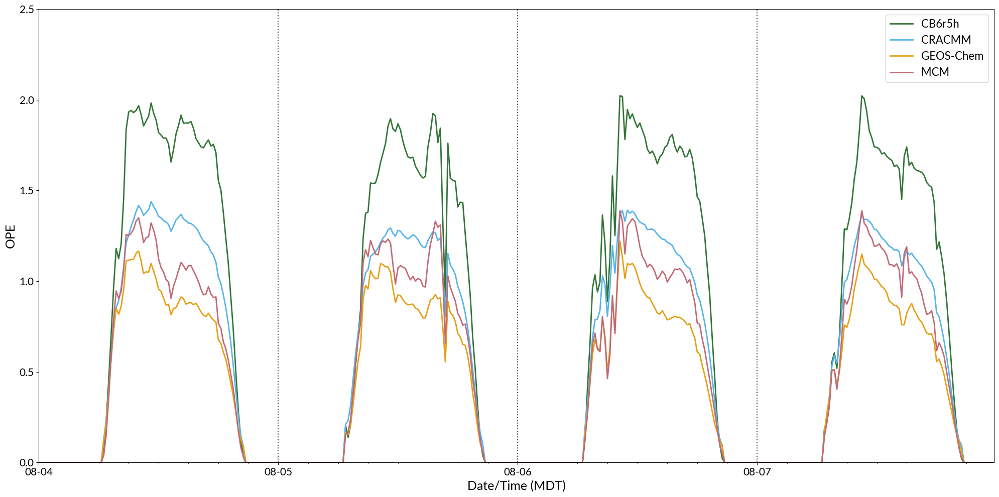

In [128]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_ope_total, label = 'CB6r5h', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_ope_total, label = 'CRACMM', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_ope_total, label = 'GEOS-Chem', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_ope_total, label = 'MCM',linewidth = 2, color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('OPE')
plt.ylim([0,2.5])
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ope_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

In [129]:
CB6r5h_RO2_NO_scaled_rates      = np.array(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
CB6r5h_HO2_NO_rates             = np.array(CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate'])
CB6r5h_lost_NOx_sum_rates       = np.array(CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

CRACMM_RO2_NO_scaled_rates      = np.array(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
CRACMM_HO2_NO_rates             = np.array(CRACMM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0807['HO2_NO_rate'])
CRACMM_lost_NOx_sum_rates       = np.array(CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

GEOS_Chem_RO2_NO_scaled_rates   = np.array(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
GEOS_Chem_HO2_NO_rates             = np.array(GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate'])
GEOS_Chem_lost_NOx_sum_rates    = np.array(GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

MCM_RO2_NO_scaled_rates         = np.array(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
MCM_HO2_NO_rates             = np.array(MCM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0807['HO2_NO_rate'])
MCM_lost_NOx_sum_rates          = np.array(MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])
# contribution_RO2_NO_CB6r5h      = (np.ndarray(CB6r5h_RO2_NO_scaled_rates) / np.ndarray(CB6r5h_lost_NOx_sum_rates))
# contribution_RO2_NO_CRACMM      = (np.ndarray(CRACMM_RO2_NO_scaled_rates) / np.ndarray(CRACMM_lost_NOx_sum_rates))
# contribution_RO2_NO_GEOS_Chem   = (np.ndarray(GEOS_Chem_RO2_NO_scaled_rates) / np.ndarray(GEOS_Chem_lost_NOx_sum_rates))
# contribution_RO2_NO_MCM         = (np.ndarray(MCM_RO2_NO_scaled_rates) / np.ndarray(MCM_lost_NOx_sum_rates))

# CB6r5h_ro2_labels               = CB6r5h_yaml_usos_analysis_0804['RO2_list']
# CRACMM_ro2_labels               = CRACMM_yaml_usos_analysis_0804['RO2_list']
# GEOS_Chem_ro2_labels            = GEOS_Chem_yaml_usos_analysis_0804['RO2_list']
# MCM_ro2_labels                  = MCM_yaml_usos_analysis_0804['RO2_list']

In [130]:
CB6r5h_RO2_NO_conversion_sum_rates      = np.array(CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
CB6r5h_HO2_NO_rates             = np.array(CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate'])
CB6r5h_lost_NOx_sum_rates       = np.array(CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

CRACMM_RO2_NO_conversion_sum_rates      = np.array(CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
CRACMM_HO2_NO_rates             = np.array(CRACMM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0807['HO2_NO_rate'])
CRACMM_lost_NOx_sum_rates       = np.array(CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

GEOS_Chem_RO2_NO_conversion_sum_rates   = np.array(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
GEOS_Chem_HO2_NO_rates             = np.array(GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate'])
GEOS_Chem_lost_NOx_sum_rates    = np.array(GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

MCM_RO2_NO_conversion_sum_rates         = np.array(MCM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
MCM_HO2_NO_rates             = np.array(MCM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0807['HO2_NO_rate'])
MCM_lost_NOx_sum_rates          = np.array(MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

In [131]:
CB6r5h_RO2_NO_conversion_sum_rates      = CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
CB6r5h_HO2_NO_rates             = CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate']
CB6r5h_PO3_sum = np.array(CB6r5h_RO2_NO_conversion_sum_rates) + np.array(CB6r5h_HO2_NO_rates)

CRACMM_RO2_NO_conversion_sum_rates      = CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
CRACMM_HO2_NO_rates             = CRACMM_yaml_usos_analysis_0804['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0805['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0806['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0807['HO2_NO_rate']
CRACMM_PO3_sum = np.array(CRACMM_RO2_NO_conversion_sum_rates) + np.array(CRACMM_HO2_NO_rates)

GEOS_Chem_RO2_NO_conversion_sum_rates   = GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
GEOS_Chem_HO2_NO_rates             = GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate']
GEOS_Chem_PO3_sum = np.array(GEOS_Chem_RO2_NO_conversion_sum_rates) + np.array(GEOS_Chem_HO2_NO_rates)

MCM_RO2_NO_conversion_sum_rates         = MCM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
MCM_HO2_NO_rates             = MCM_yaml_usos_analysis_0804['HO2_NO_rate'] + MCM_yaml_usos_analysis_0805['HO2_NO_rate'] + MCM_yaml_usos_analysis_0806['HO2_NO_rate'] + MCM_yaml_usos_analysis_0807['HO2_NO_rate']
MCM_PO3_sum = np.array(MCM_RO2_NO_conversion_sum_rates) + np.array(MCM_HO2_NO_rates)

In [132]:
CB6r5h_lost_NOx_sum_rates       = CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates']
CRACMM_lost_NOx_sum_rates       = CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates']
GEOS_Chem_lost_NOx_sum_rates    = GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates']
MCM_lost_NOx_sum_rates          = MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates']

In [133]:
CB6r5h_RO2_OPE = np.array(CB6r5h_RO2_NO_conversion_sum_rates) / np.array(CB6r5h_lost_NOx_sum_rates)
CRACMM_RO2_OPE = np.array(CRACMM_RO2_NO_conversion_sum_rates) / np.array(CRACMM_lost_NOx_sum_rates)
GEOS_Chem_RO2_OPE = np.array(GEOS_Chem_RO2_NO_conversion_sum_rates) / np.array(GEOS_Chem_lost_NOx_sum_rates)
MCM_RO2_OPE = np.array(MCM_RO2_NO_conversion_sum_rates) / np.array(MCM_lost_NOx_sum_rates)

In [134]:
plt.plot(new_index, CB6r5h_RO2_NO_conversion_sum_rates, label = 'CB6r5h, RO2 + NO', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CB6r5h_HO2_NO_rates, label = 'CB6r5h, HO2 + NO', linewidth = 2, linestyle = 'dashed', color = four_colorset1[0].tolist())

plt.plot(new_index, CRACMM_RO2_NO_conversion_sum_rates, label = 'CRACMM, RO2 + NO',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, CRACMM_HO2_NO_rates, label = 'CRACMM, HO2 + NO',  linewidth = 2, linestyle = 'dashed',color = four_colorset1[1].tolist())

plt.plot(new_index, GEOS_Chem_RO2_NO_conversion_sum_rates, label = 'GEOS-Chem, RO2 + NO',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, GEOS_Chem_HO2_NO_rates, label = 'GEOS-Chem, HO2 + NO',  linewidth = 2,linestyle = 'dashed', color = four_colorset1[2].tolist())

plt.plot(new_index, MCM_RO2_NO_conversion_sum_rates, label = 'MCM, RO2 + NO',linewidth = 2, linestyle = 'solid',color = four_colorset1[3].tolist())
plt.plot(new_index, MCM_HO2_NO_rates, label = 'MCM, HO2 + NO',linewidth = 2, linestyle = 'dashed',color = four_colorset1[3].tolist())

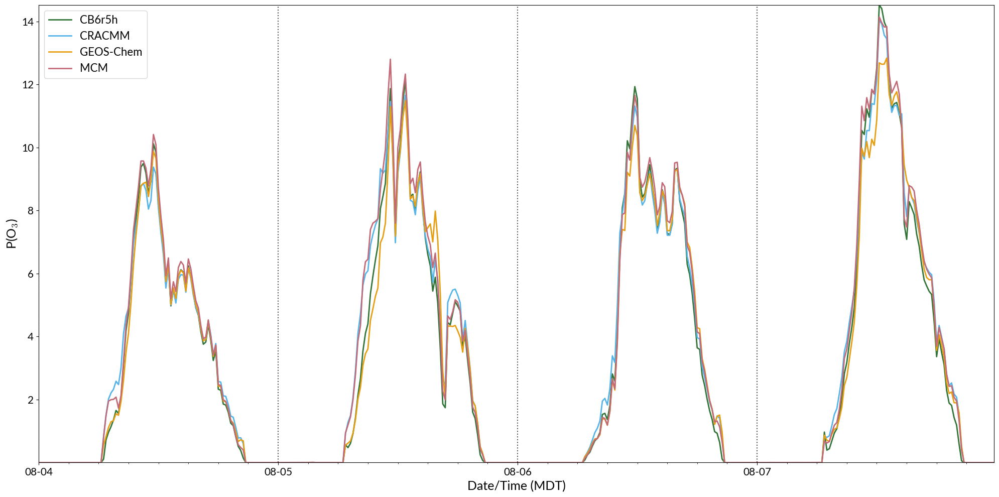

In [135]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_PO3_sum, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_PO3_sum, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_PO3_sum, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_PO3_sum, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('P(O$_3$)')
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/production_ozone_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

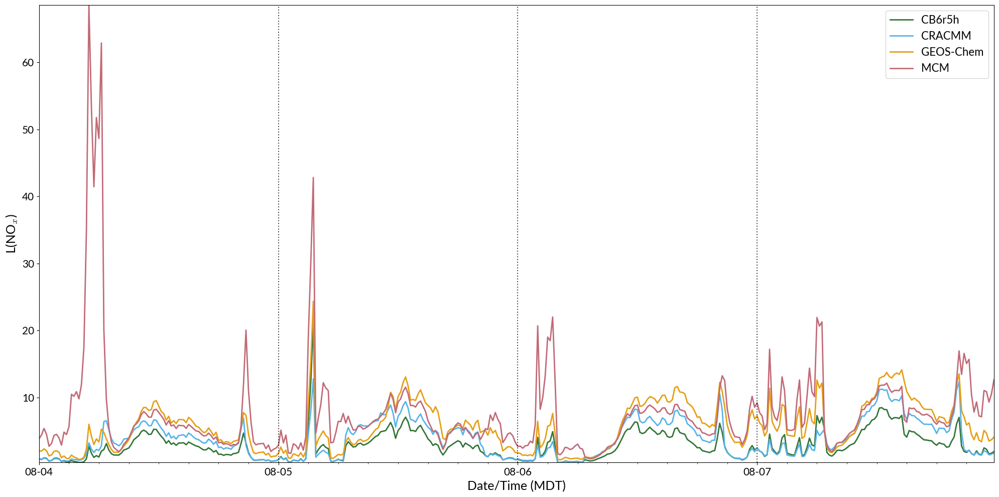

In [136]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_lost_NOx_sum_rates, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_lost_NOx_sum_rates, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_lost_NOx_sum_rates, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_lost_NOx_sum_rates, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('L(NO$_x$)')
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/loss_nox_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

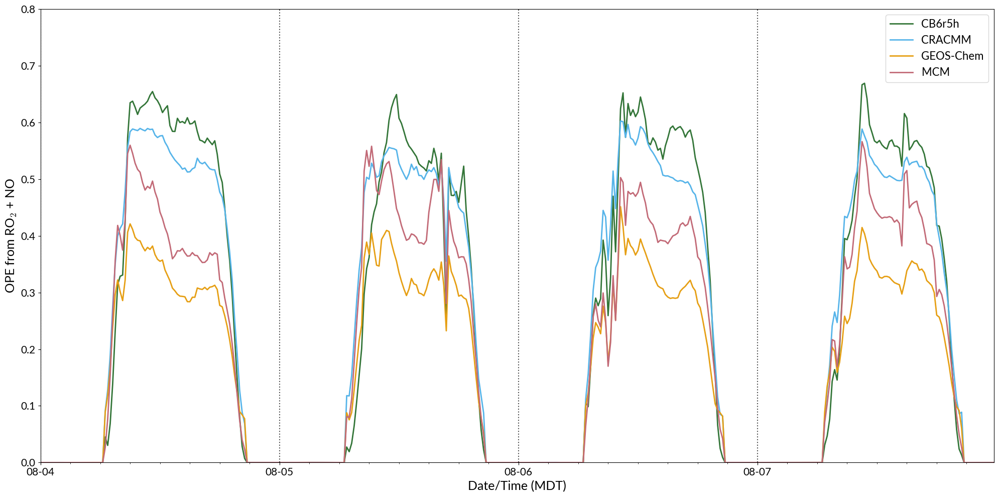

In [137]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_RO2_OPE, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_RO2_OPE, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_RO2_OPE, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_RO2_OPE, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend(loc ='upper right')

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('OPE from RO$_2$ + NO')
plt.ylim([0,0.8])
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ro2_no_ope_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

## RO2 Analysis

In [138]:
print(CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'])
print(CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'])

['C2O3 + NO = MEO2+ NO2+ RO2', 'CXO3 + NO = ALD2+ XO2H+ NO2+ RO2', 'MEO2 + NO = FORM+ NO2+ HO2', 'HCO3 + NO = FACD+ NO2+ HO2', 'ISO2 + NO = 0.673FORM+ 0.1INTR+ 0.9ISPD+ 0.082XO2H+ 0.9NO2+ 0.082RO2+ 0.818HO2', 'EPX2 + NO = 0.375FORM+ 0.275GLY+ 0.275GLYD+ 0.275MGLY+ 2.175PAR+ NO2+ 0.251CO+ 0.125OH+ 0.825HO2', 'BZO2 + NO = 0.918GLY+ 0.082NTR2+ 0.918OPEN+ 0.918NO2+ 0.918HO2', 'NO + TO2 = 0.417GLY+ 0.443MGLY+ 0.14NTR2+ 0.66OPEN+ 0.2XOPN+ 0.86NO2+ 0.86HO2', 'NO + XLO2 = 0.221GLY+ 0.675MGLY+ 0.14NTR2+ 0.3OPEN+ 0.56XOPN+ 0.86NO2+ 0.86HO2', 'NO + OPO3 = 0.2CXO3+ 0.5GLY+ NO2+ 0.5CO+ 0.8HO2']
['ISOP + NO = 0.13000*ISON +  0.40000*HCHO +  0.88000*HO2 +  0.87000*NO2 +  0.18000*MACR +  0.51000*MVK ', 'MO2 + NO = HO2 + NO2 + HCHO ', 'ETHP + NO = HO2 + NO2 + ACD ', 'HC3P + NO = 0.66000*HO2 +  0.13100*MO2 +  0.04800*ETHP +  0.08900*XO2 +  0.93500*NO2 +  0.50400*ACD +  0.13200*ALD +  0.16500*ACT +  0.04200*MEK +  0.06500*ONIT ', 'HC5P + NO = 0.20000*HO2 +  0.05100*MO2 +  0.23100*ETHP +  0.23500*XO2 +  0

In [139]:
RO2_labels_CB6r5h = []
RO2_labels_CRACMM = []
RO2_labels_GEOS_Chem = []
RO2_labels_MCM = []

for rxn in CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_CB6r5h.append(species.strip())

for rxn in CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_CRACMM.append(species.strip())

for rxn in GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_GEOS_Chem.append(species.strip())

for rxn in MCM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if " + NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_MCM.append(species.strip())


Passing NO +:  NO + TO2 = 0.417GLY+ 0.443MGLY+ 0.14NTR2+ 0.66OPEN+ 0.2XOPN+ 0.86NO2+ 0.86HO2
TO2 
Passing NO +:  NO + XLO2 = 0.221GLY+ 0.675MGLY+ 0.14NTR2+ 0.3OPEN+ 0.56XOPN+ 0.86NO2+ 0.86HO2
XLO2 
Passing NO +:  NO + OPO3 = 0.2CXO3+ 0.5GLY+ NO2+ 0.5CO+ 0.8HO2
OPO3 
Passing NO +:  NO + HYPROPO2 = HYPROPO + NO2
HYPROPO2 


In [140]:
print(RO2_labels_CB6r5h)
print(RO2_labels_CRACMM)
print(RO2_labels_GEOS_Chem)
print(RO2_labels_MCM)

['C2O3', 'CXO3', 'MEO2', 'HCO3', 'ISO2', 'EPX2', 'BZO2', 'TO2', 'XLO2', 'OPO3']
['ISOP', 'MO2', 'ETHP', 'HC3P', 'HC5P', 'ETEP', 'OLTP', 'OLIP', 'BENP', 'TOLP', 'XYLP', 'EBZP', 'APIP1', 'APIP2', 'APINP1', 'APINP2', 'LIMP1', 'LIMP2', 'LIMNP1', 'LIMNP2', 'ACO3', 'RCO3', 'ACTP', 'KETP', 'MACP', 'MCP', 'MVKP', 'UALP', 'BALP', 'BAL1', 'ORAP', 'OLNN', 'OLND', 'BDE13P', 'FURANO2', 'SESQNRO2', 'SESQRO2', 'VROCP6ALKP', 'VROCP5ALKP', 'VROCP4ALKP', 'VROCP3ALKP', 'VROCP2ALKP', 'VROCP1ALKP', 'HC10P', 'VROCP6ALKP2', 'VROCP5ALKP2', 'VROCP4ALKP2', 'VROCP3ALKP2', 'VROCP2ALKP2', 'VROCP1ALKP2', 'HC10P2', 'VROCP6AROP', 'VROCP5AROP', 'NAPHP', 'STYP']
['MO2', 'MCO3', 'ETO2', 'OTHRO2', 'A3O2', 'PO2', 'R7O2', 'R7N1', 'BUTO2', 'ACRO2', 'ACO3', 'ALK4O2', 'ALK4N1', 'R4O2', 'R4N1', 'ATO2', 'KO2', 'B3O2', 'PRN1', 'RCO3', 'KO2', 'MEKCO3', 'GCO3', 'APINO2', 'PINO3', 'C96O2', 'BPINO2', 'BPINOO2', 'LIMO2', 'LIMKO2', 'LIMO3', 'PIO2', 'OLNN', 'OLND', 'IHOO1', 'IHOO1', 'IHOO4', 'IHOO4', 'IHPOO1', 'IHPOO2', 'IHPOO3', 'IEPO

In [141]:
print(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'][32])

OLNN+NO=HO2+NO2+MONITS


In [142]:
CB6r5h_sum_total_ro2_prod_CB6r5h = np.vstack([
    np.sum(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

CB6r5h_ro2_fractional_contribution= np.vstack([
    CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[0] * 100,
    CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[1] * 100,
    CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[2] * 100,
    CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[3] * 100
    ])

CRACMM_sum_total_ro2_prod_CRACMM = np.vstack([
    np.sum(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

CRACMM_ro2_fractional_contribution= np.vstack([
    CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[0] * 100,
    CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[1] * 100,
    CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[2] * 100,
    CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[3] * 100
    ])

GEOS_Chem_sum_total_ro2_prod_GEOS_Chem = np.vstack([
    np.sum(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

GEOS_Chem_ro2_fractional_contribution= np.vstack([
    GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[0] * 100,
    GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[1] * 100,
    GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[2] * 100,
    GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[3] * 100
    ])

MCM_sum_total_ro2_prod_MCM = np.vstack([
    np.sum(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

MCM_ro2_fractional_contribution= np.vstack([
    MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[0] * 100,
    MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[1] * 100,
    MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[2] * 100,
    MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[3] * 100
    ])



(10, 96)
(55, 96)
(69, 96)
(1233, 96)


In [143]:
day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))

96


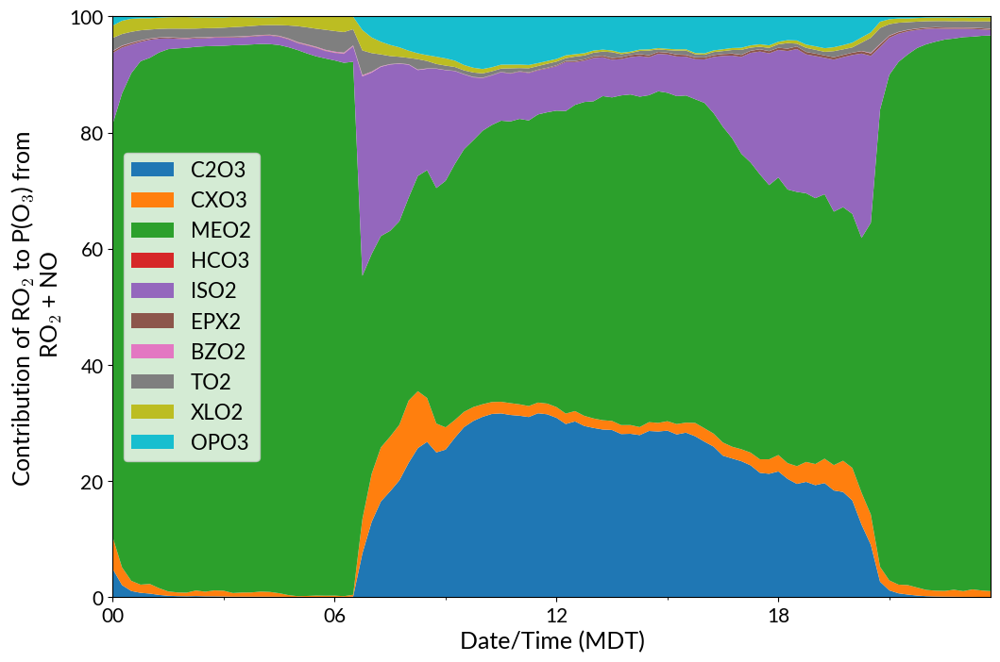

In [144]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CB6r5h_ro2_fractional_contribution[0:10,:], labels = RO2_labels_CB6r5h)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

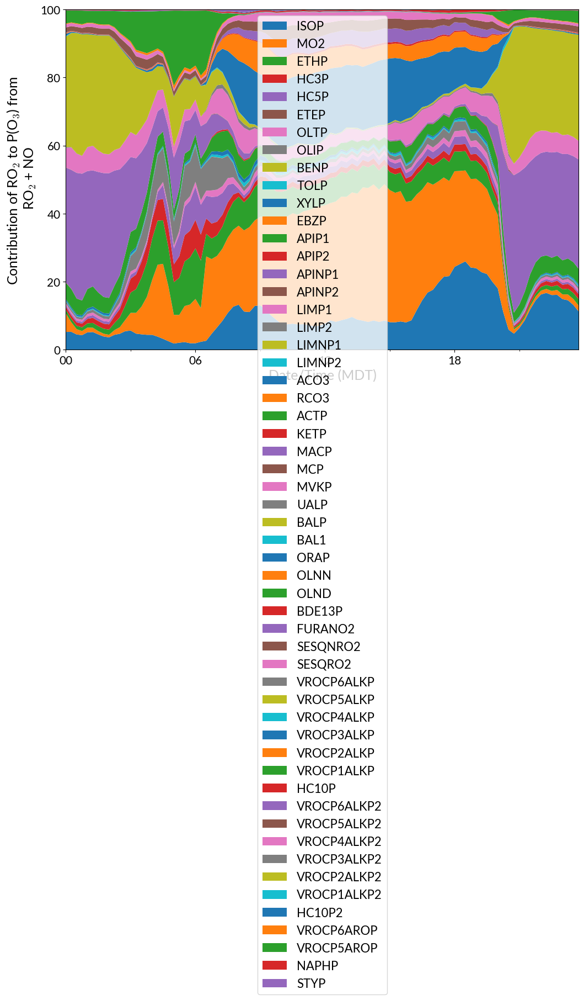

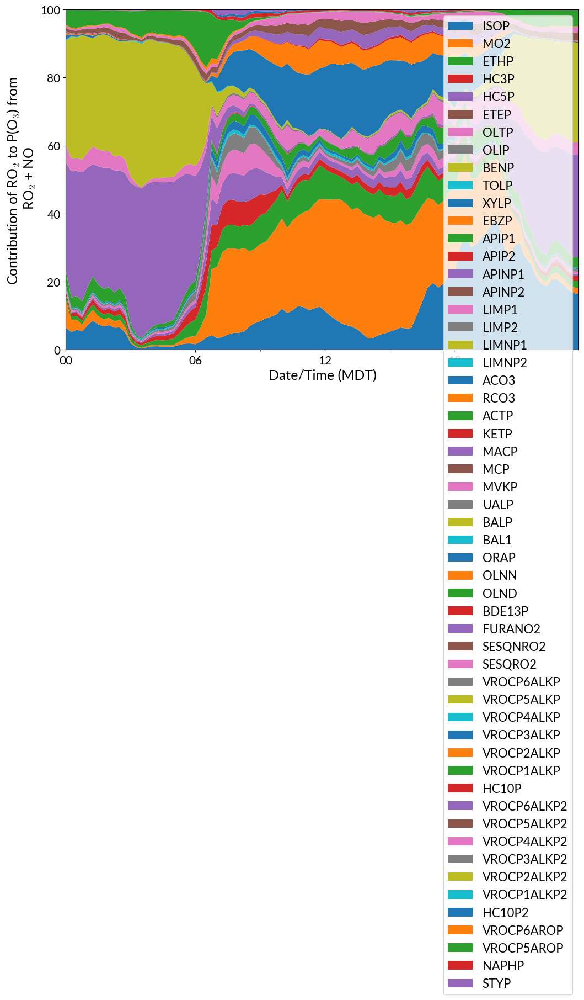

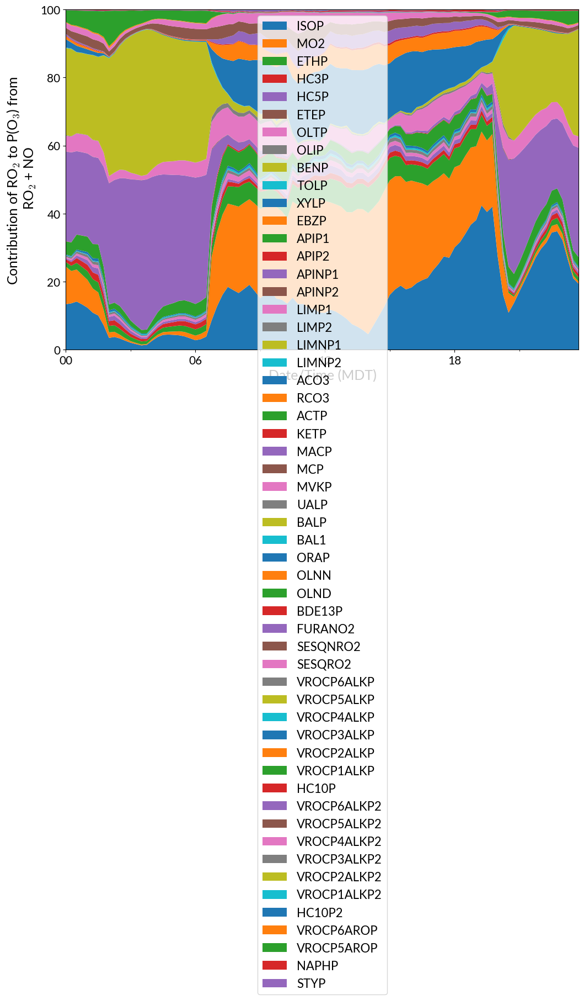

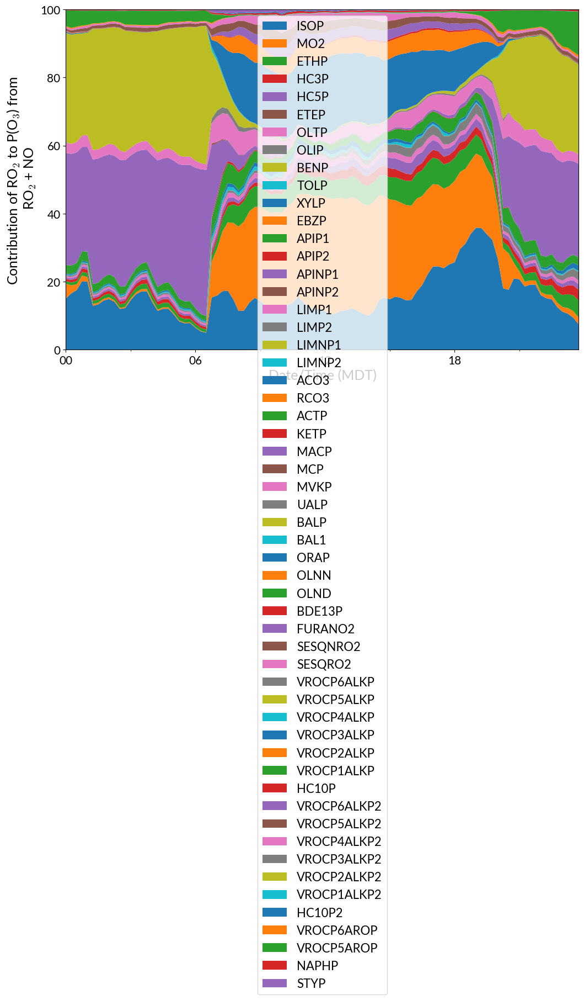

In [145]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[0:55,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 2: 0805
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55:55*2,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 3: 0806
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55*2:55*3,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 4: 0806
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55*3:55*4,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [123]:
for spec in RO2_labels_GEOS_Chem:
    if 'OLNN' in spec:
        print(RO2_labels_GEOS_Chem.index(spec))
    else:
        pass

32


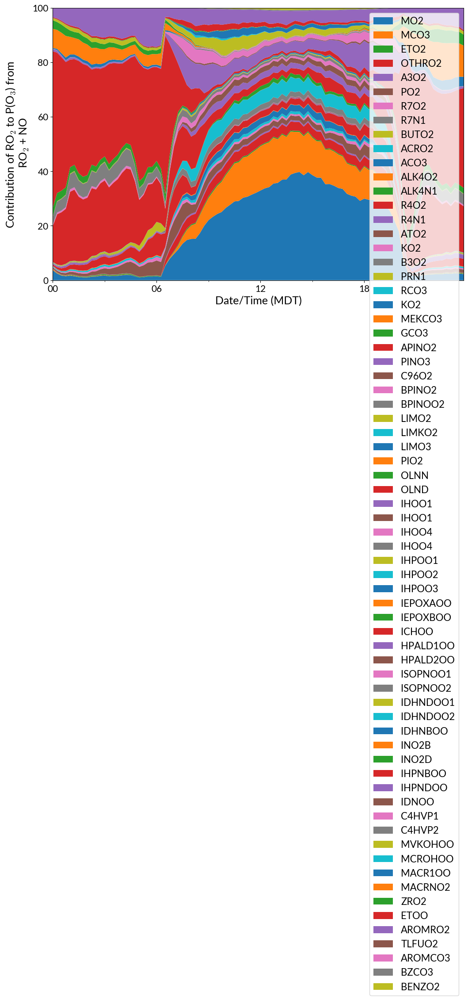

In [146]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, GEOS_Chem_ro2_fractional_contribution[0:69,:], labels = RO2_labels_GEOS_Chem)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [ ]:
ro2_fraction_contribution_CB6r5h = (CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / sum_total_voc_prod)*100

df_geoschem_ro2['Fractional Contribution of VOC'] = [spec for spec in voc_fraction]

## Ozone Time Series

In [150]:
df_CB6r5h_hrly_species_conc = df_CB6r5h_species_conc.copy()
print(df_CB6r5h_hrly_species_conc)
df_CRACMM_hrly_species_conc = df_CRACMM_species_conc.copy()
df_GEOSChem_hrly_species_conc = df_GEOSChem_species_conc.copy()
df_MCM_hrly_species_conc = df_MCM_species_conc.copy()

df_CB6r5h_hrly_species_conc.set_index(new_index, inplace=True)
df_CRACMM_hrly_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_hrly_species_conc.set_index(new_index, inplace=True)
df_MCM_hrly_species_conc.set_index(new_index, inplace=True)

hour_range = np.arange(0,24,1)

     O3Initconc     O3conc  NOInitconc        NOconc  NO2Initconc   NO2conc  \
0     44.585778  44.128407    0.086469  1.742353e-06     1.991506  2.077974   
1     44.374667  43.695325    0.314791  1.070821e-06     1.972488  2.287277   
2     42.908889  43.323696    0.294459  1.274083e-06     2.520365  2.814823   
3     42.900000  43.020928    0.110087  9.647658e-07     2.483201  2.593286   
4     43.119111  42.734874    0.096860  2.952621e-07     1.681178  1.778038   
..          ...        ...         ...           ...          ...       ...   
379   49.891111  45.810237    0.192904  1.271317e-06     3.813621  4.006524   
380   49.955111  45.163786    0.513091  1.101016e-06     3.296744  3.809835   
381   52.039111  44.570162    0.416032  6.856234e-07     2.733300  3.149331   
382   52.240889  44.053084    0.350160  7.419489e-07     2.973396  3.323555   
383   49.746667  43.553381    0.054440  8.362391e-07     3.731194  3.785633   

     HO2Initconc   HO2conc  HONOInitconc  HONOconc 

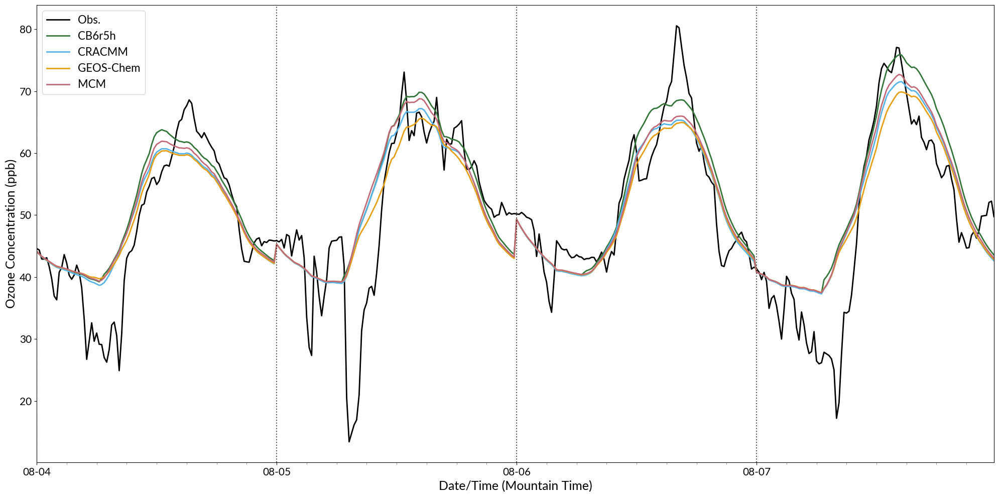

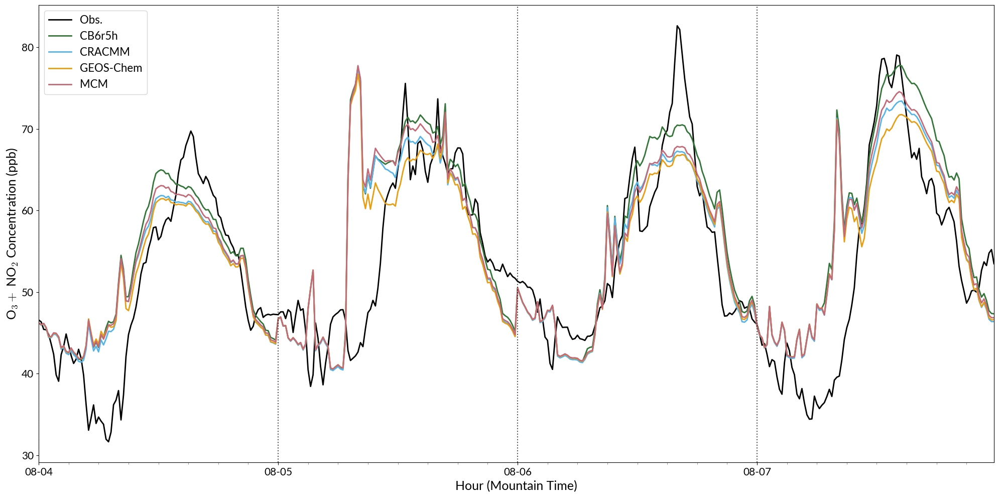

In [151]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Date/Time (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_3 + $ NO$_2$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/o3_no2_sum_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

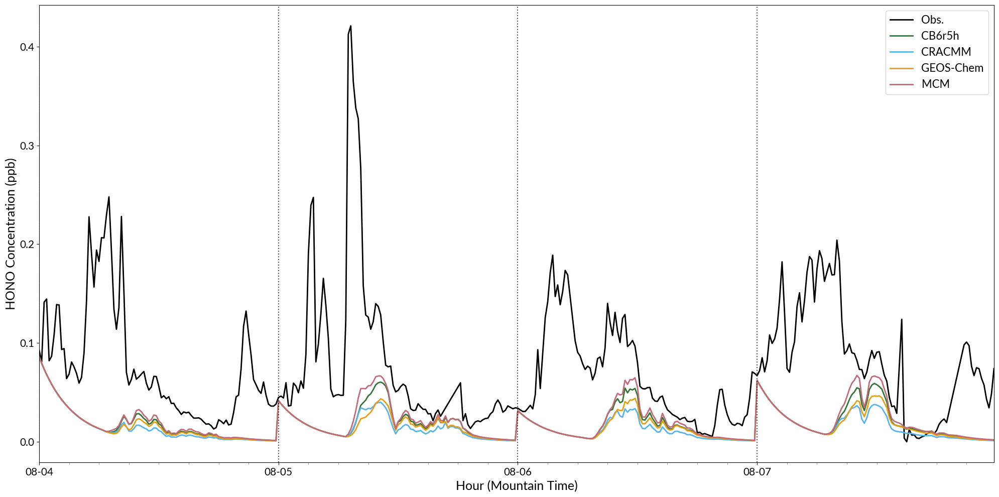

In [152]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['HONOInitconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['HONOconc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['HONOconc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['HNO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['HONOconc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('HONO Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
#plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

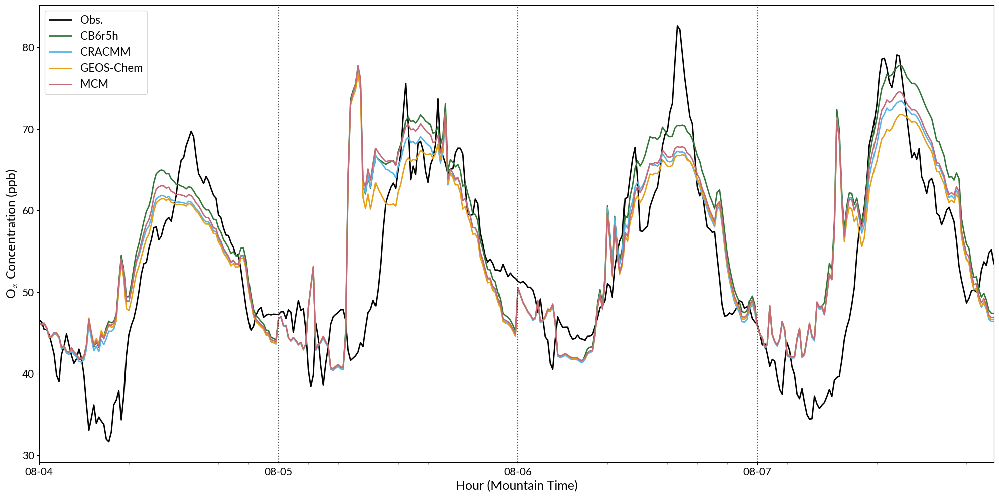

In [153]:
Obs_Ox = df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc']
CB6r5h_Ox = df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc']
CRACMM_Ox = df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc']
GEOSChem_Ox = df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc']
MCM_Ox = df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc']+2*df_MCM_species_conc['NO3conc']+3*df_MCM_species_conc['N2O5conc']

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc']+2*df_MCM_species_conc['NO3conc']+3*df_MCM_species_conc['N2O5conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_x$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

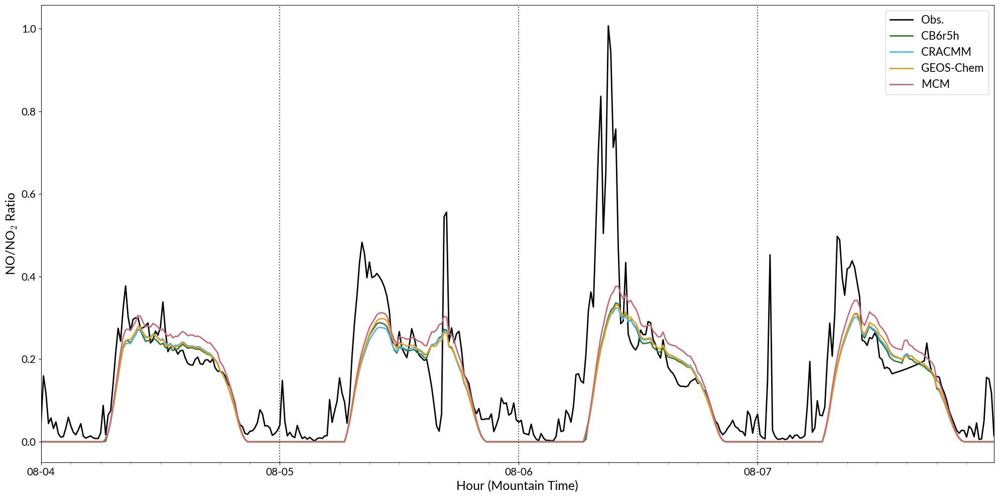

In [154]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NOInitconc']/df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NOconc']/df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NOconc']/df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NOconc']/df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NOconc']/df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO/NO$_2$ Ratio')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_no2_ratio_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

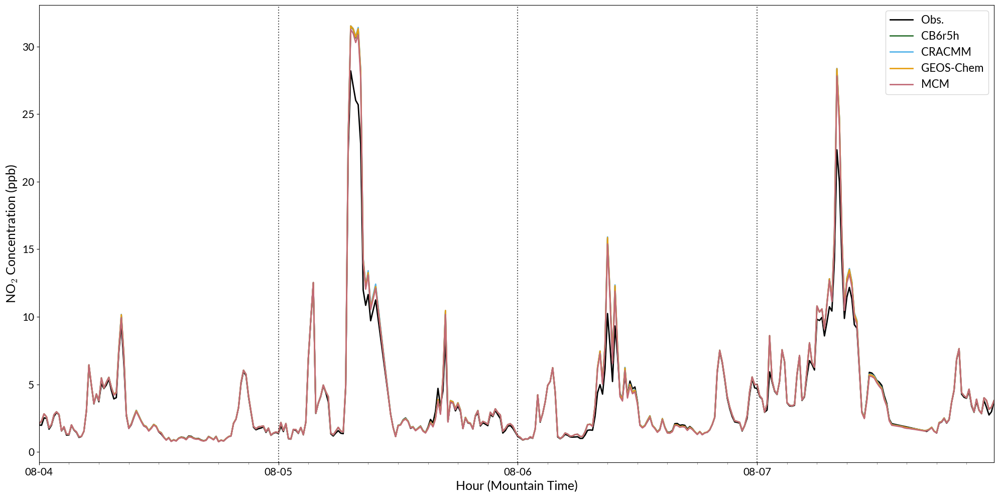

In [155]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO$_2$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no2_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

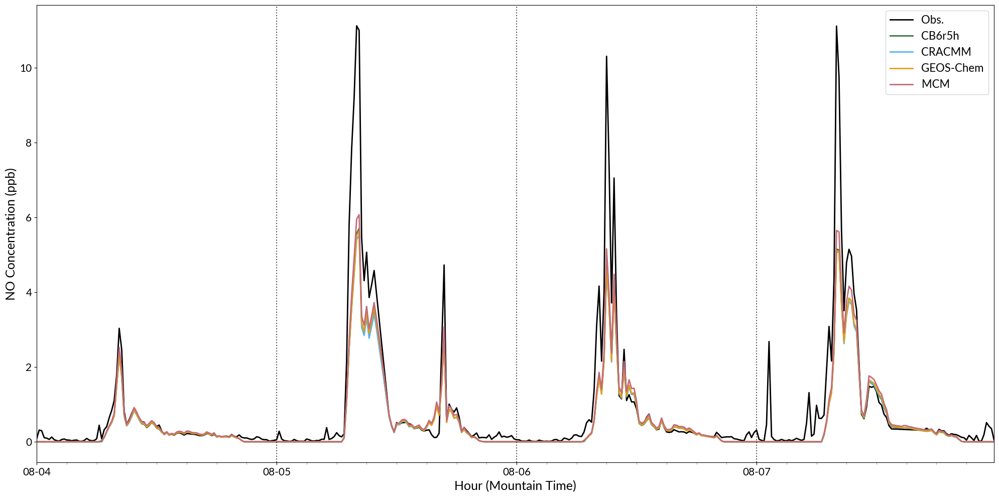

In [156]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NOInitconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NOconc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NOconc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NOconc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NOconc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

## Mean Bias Ozone

2.8100040275449167
[0.2, 0.4588235294117647, 0.2196078431372549]
1.4740205768055648
[0.33725490196078434, 0.7058823529411765, 0.9137254901960784]
1.0206210430820153
[0.9019607843137255, 0.6235294117647059, 0.0784313725490196]
1.9271985957975613
[0.7607843137254902, 0.41568627450980394, 0.4666666666666667]


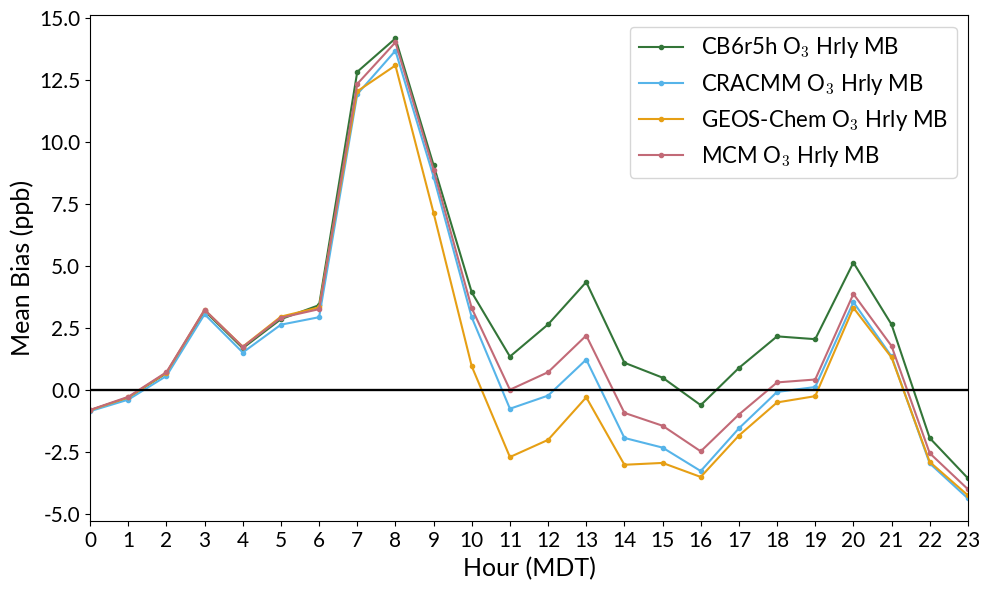

In [24]:
df_o3 = pd.DataFrame({'obs':df_CB6r5h_hrly_species_conc['O3Initconc'], 'CB6r5h':df_CB6r5h_hrly_species_conc['O3conc'], 'CRACMM':df_CRACMM_hrly_species_conc['O3conc'], 'GEOS-Chem':df_GEOSChem_hrly_species_conc['O3conc'], 'MCM':df_MCM_hrly_species_conc['O3conc']})
mech_varlist = ['CB6r5h', 'CRACMM', 'GEOS-Chem', 'MCM']

plt.figure(figsize=(10,6), tight_layout = True)
for mech_var in mech_varlist:
    df_o3['O3_diff']= df_o3[mech_var]-df_o3['obs']
    mb_total = df_o3['O3_diff'].dropna().mean()
    print(mb_total)

    df_o3['hour']=df_o3.index.hour
    hourly_MB = df_o3.groupby(df_o3.index.hour)['O3_diff'].mean()

    if mech_var == 'CB6r5h':
        color_val = four_colorset1[0].tolist()
    elif mech_var == 'CRACMM':
        color_val = four_colorset1[1].tolist()
    elif mech_var == 'GEOS-Chem':
        color_val = four_colorset1[2].tolist()
    elif mech_var == 'MCM':
        color_val = four_colorset1[3].tolist()
    else:
        print('Mechanism name invalid')

    print(color_val)
    # Plot the hourly Mean Bias and the average over time: 
    plt.plot(hourly_MB.index, hourly_MB, color=color_val, marker='.', label=f"{mech_var} O$_3$ Hrly MB")
    plt.hlines(y=0, xmin=hourly_MB.index[0], xmax= hourly_MB.index[len(hourly_MB)-1], linestyle='solid', color = 'k')
    # plt.plot(hourly_MB.index, np.ones(len(hourly_MB.index))*mb_total, linestyle = 'dashed', color=color_val,label=f"Avg. MB={mb_total:.2f} ppb")
    #plt.fill_between(hourly_MB.index, -1.5, 1.5,  color = 'm', alpha = 0.2, label = 'Instrum. Uncertainty = $\pm$ 1.5 ppb')

    #plt.ylim([-0.14, 0])
    #plt.title('Mean Bias')
    plt.ylabel('Mean Bias (ppb)')
    plt.xlabel('Hour (MDT)')
    plt.xlim([0, 23])
    plt.xticks(hour_range)
    #plt.yticks(np.arange(-7, 3, 1))
    plt.grid()
    plt.legend(loc='upper right')
    plt.savefig(dirpath + '/F0AM_run_analysis/plots/hrly_mean_bias_ozone_mechanism_comparison_timeseries_08042024_08072024.png', dpi =300)
plt.show()